In [137]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np

import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import yfinance as yf

In this workshop, we're going to be working with a popular python library called plotly. We'll primarily be using the submodule plotly express. Plotly express is a high-level, user-friendly module that allows us to quickly develop common chart types. For more advanced chart types (namely Sankey diagrams) we'll use the Graph Objects submodule. 

The dataset we'll be using today is from the NYFD. Specifically, we'll be looking at various data related to fire incidents in New York City in the second half of 2024. Let's get started!

In [138]:
#read in the data
df=pd.read_csv('https://raw.githubusercontent.com/nickxscott/INFO658/refs/heads/main/notebooks/data/Fire_Incident_Dispatch_Data_20260315.csv')
df.head()

,STARFIRE_INCIDENT_ID,INCIDENT_DATETIME,ALARM_BOX_BOROUGH,ALARM_BOX_NUMBER,ALARM_BOX_LOCATION,INCIDENT_BOROUGH,ZIPCODE,POLICEPRECINCT,CITYCOUNCILDISTRICT,COMMUNITYDISTRICT,...,FIRST_ACTIVATION_DATETIME,FIRST_ON_SCENE_DATETIME,INCIDENT_CLOSE_DATETIME,VALID_DISPATCH_RSPNS_TIME_INDC,VALID_INCIDENT_RSPNS_TIME_INDC,INCIDENT_RESPONSE_SECONDS_QY,INCIDENT_TRAVEL_TM_SECONDS_QY,ENGINES_ASSIGNED_QUANTITY,LADDERS_ASSIGNED_QUANTITY,OTHER_UNITS_ASSIGNED_QUANTITY
0,240801-B0920-001-0002,08/01/2024 12:00:20 AM,BROOKLYN,920,ALBANY AVE & PROSPECT PL,BROOKLYN,11213.0,77.0,36.0,308.0,...,08/01/2024 12:01:01 AM,08/01/2024 12:03:49 AM,08/01/2024 12:37:58 AM,N,Y,208,177,3.0,2.0,1.0
1,240801-X3123-001-0001,08/01/2024 12:00:26 AM,BRONX,3123,E BURNSIDE AVE & GRAND CONCOURSE,BRONX,10453.0,46.0,14.0,205.0,...,08/01/2024 12:00:37 AM,NaN,08/01/2024 12:08:43 AM,N,N,NaN,NaN,1.0,0.0,0.0
2,240801-X3397-001-0002,08/01/2024 12:00:45 AM,BRONX,3397,BRIGGS AVE & E 197 ST,BRONX,10458.0,52.0,15.0,207.0,...,08/01/2024 12:03:47 AM,NaN,08/01/2024 12:04:22 AM,N,N,NaN,NaN,1.0,0.0,0.0
3,240801-B1873-003-0004,08/01/2024 12:01:05 AM,BROOKLYN,1873,LORING AVE & ELDERTS LANE,BROOKLYN,11208.0,75.0,42.0,305.0,...,08/01/2024 12:01:26 AM,08/01/2024 12:03:39 AM,08/01/2024 12:12:45 AM,N,Y,153,141,1.0,1.0,0.0
4,240801-M1071-002-0004,08/01/2024 12:02:13 AM,MANHATTAN,1071,AMSTERDAM AVE & W 77 ST,MANHATTAN,10024.0,20.0,6.0,107.0,...,08/01/2024 12:02:45 AM,08/01/2024 12:05:03 AM,08/01/2024 12:36:11 AM,N,Y,169,147,0.0,1.0,0.0


In [139]:
print(f'There are {len(df)} rows in this dataset')

There are 290855 rows in this dataset


Let's take a look at the columns that are available and the datatypes of each

In [140]:
df.columns

Index(['STARFIRE_INCIDENT_ID', 'INCIDENT_DATETIME', 'ALARM_BOX_BOROUGH',
       'ALARM_BOX_NUMBER', 'ALARM_BOX_LOCATION', 'INCIDENT_BOROUGH', 'ZIPCODE',
       'POLICEPRECINCT', 'CITYCOUNCILDISTRICT', 'COMMUNITYDISTRICT',
       'COMMUNITYSCHOOLDISTRICT', 'CONGRESSIONALDISTRICT',
       'ALARM_SOURCE_DESCRIPTION_TX', 'ALARM_LEVEL_INDEX_DESCRIPTION',
       'HIGHEST_ALARM_LEVEL', 'INCIDENT_CLASSIFICATION',
       'INCIDENT_CLASSIFICATION_GROUP', 'DISPATCH_RESPONSE_SECONDS_QY',
       'FIRST_ASSIGNMENT_DATETIME', 'FIRST_ACTIVATION_DATETIME',
       'FIRST_ON_SCENE_DATETIME', 'INCIDENT_CLOSE_DATETIME',
       'VALID_DISPATCH_RSPNS_TIME_INDC', 'VALID_INCIDENT_RSPNS_TIME_INDC',
       'INCIDENT_RESPONSE_SECONDS_QY', 'INCIDENT_TRAVEL_TM_SECONDS_QY',
       'ENGINES_ASSIGNED_QUANTITY', 'LADDERS_ASSIGNED_QUANTITY',
       'OTHER_UNITS_ASSIGNED_QUANTITY'],
      dtype='object')

In [141]:
df.dtypes

STARFIRE_INCIDENT_ID               object
INCIDENT_DATETIME                  object
ALARM_BOX_BOROUGH                  object
ALARM_BOX_NUMBER                    int64
ALARM_BOX_LOCATION                 object
INCIDENT_BOROUGH                   object
ZIPCODE                           float64
POLICEPRECINCT                    float64
CITYCOUNCILDISTRICT               float64
COMMUNITYDISTRICT                 float64
COMMUNITYSCHOOLDISTRICT           float64
CONGRESSIONALDISTRICT             float64
ALARM_SOURCE_DESCRIPTION_TX        object
ALARM_LEVEL_INDEX_DESCRIPTION      object
HIGHEST_ALARM_LEVEL                object
INCIDENT_CLASSIFICATION            object
INCIDENT_CLASSIFICATION_GROUP      object
DISPATCH_RESPONSE_SECONDS_QY       object
FIRST_ASSIGNMENT_DATETIME          object
FIRST_ACTIVATION_DATETIME          object
FIRST_ON_SCENE_DATETIME            object
INCIDENT_CLOSE_DATETIME            object
VALID_DISPATCH_RSPNS_TIME_INDC     object
VALID_INCIDENT_RSPNS_TIME_INDC    

# Data Cleaning and Exploratory Visualization

Things we want to clean up:

set INCIDENT_DATETIME, FIRST_ON_SCENE_DATETIME, and INCIDENT_CLOSE_DATETIME columns to datetime dtype

find difference between FIRST_ON_SCENE_DATETIME and INCIDENT_CLOSE_DATETIME - to do this in python we can simply subtract the earlier timestamp from the later timestamp and extract the seconds. this gives us the total time the Fire Department spent on the scene for the incident

create separate column for the incident date only (no timestamp)

set INCIDENT_RESPONSE_SECONDS_QY and INCIDENT_TRAVEL_TM_SECONDS_QY to integer type

remove outliers from quantitative columns

create binary category for ladder assigned

create binary category for responses longer than 5 minutes

In [142]:
#set incident datetime, first on scene datetime, and incident close datetime to datetime data type
df.INCIDENT_DATETIME=pd.to_datetime(df.INCIDENT_DATETIME, format='%m/%d/%Y %I:%M:%S %p')
df.FIRST_ON_SCENE_DATETIME=pd.to_datetime(df.FIRST_ON_SCENE_DATETIME, format='%m/%d/%Y %I:%M:%S %p')
df.INCIDENT_CLOSE_DATETIME=pd.to_datetime(df.INCIDENT_CLOSE_DATETIME, format='%m/%d/%Y %I:%M:%S %p')

In [143]:
#calculate total time spent on scene. This example shows how the calculation works, just on the first row of data
diff=df.INCIDENT_CLOSE_DATETIME[0]-df.FIRST_ON_SCENE_DATETIME[0]
diff.total_seconds()

2049.0

In [144]:
#now let's do this on the entire dataset
time_on_scene=[]
for index, row in df.iterrows():
    arrive=row.FIRST_ON_SCENE_DATETIME
    close=row.INCIDENT_CLOSE_DATETIME
    diff=close-arrive
    time_on_scene.append(diff.total_seconds())
df['time_on_scene']=time_on_scene

df.head()

,STARFIRE_INCIDENT_ID,INCIDENT_DATETIME,ALARM_BOX_BOROUGH,ALARM_BOX_NUMBER,ALARM_BOX_LOCATION,INCIDENT_BOROUGH,ZIPCODE,POLICEPRECINCT,CITYCOUNCILDISTRICT,COMMUNITYDISTRICT,...,FIRST_ON_SCENE_DATETIME,INCIDENT_CLOSE_DATETIME,VALID_DISPATCH_RSPNS_TIME_INDC,VALID_INCIDENT_RSPNS_TIME_INDC,INCIDENT_RESPONSE_SECONDS_QY,INCIDENT_TRAVEL_TM_SECONDS_QY,ENGINES_ASSIGNED_QUANTITY,LADDERS_ASSIGNED_QUANTITY,OTHER_UNITS_ASSIGNED_QUANTITY,time_on_scene
0,240801-B0920-001-0002,2024-08-01 00:00:20,BROOKLYN,920,ALBANY AVE & PROSPECT PL,BROOKLYN,11213.0,77.0,36.0,308.0,...,2024-08-01 00:03:49,2024-08-01 00:37:58,N,Y,208,177,3.0,2.0,1.0,2049.0
1,240801-X3123-001-0001,2024-08-01 00:00:26,BRONX,3123,E BURNSIDE AVE & GRAND CONCOURSE,BRONX,10453.0,46.0,14.0,205.0,...,NaT,2024-08-01 00:08:43,N,N,NaN,NaN,1.0,0.0,0.0,NaN
2,240801-X3397-001-0002,2024-08-01 00:00:45,BRONX,3397,BRIGGS AVE & E 197 ST,BRONX,10458.0,52.0,15.0,207.0,...,NaT,2024-08-01 00:04:22,N,N,NaN,NaN,1.0,0.0,0.0,NaN
3,240801-B1873-003-0004,2024-08-01 00:01:05,BROOKLYN,1873,LORING AVE & ELDERTS LANE,BROOKLYN,11208.0,75.0,42.0,305.0,...,2024-08-01 00:03:39,2024-08-01 00:12:45,N,Y,153,141,1.0,1.0,0.0,546.0
4,240801-M1071-002-0004,2024-08-01 00:02:13,MANHATTAN,1071,AMSTERDAM AVE & W 77 ST,MANHATTAN,10024.0,20.0,6.0,107.0,...,2024-08-01 00:05:03,2024-08-01 00:36:11,N,Y,169,147,0.0,1.0,0.0,1868.0


In [145]:
#lets create a column that has the incident date only - no time stamp
df['date']=[x.date() for x in df.INCIDENT_DATETIME]

In [146]:
#let's make one additional column that only shows the month
df['month']=[d.strftime("%B") for d in df.date]

#lets inspect our new date columns
df.head()

,STARFIRE_INCIDENT_ID,INCIDENT_DATETIME,ALARM_BOX_BOROUGH,ALARM_BOX_NUMBER,ALARM_BOX_LOCATION,INCIDENT_BOROUGH,ZIPCODE,POLICEPRECINCT,CITYCOUNCILDISTRICT,COMMUNITYDISTRICT,...,VALID_DISPATCH_RSPNS_TIME_INDC,VALID_INCIDENT_RSPNS_TIME_INDC,INCIDENT_RESPONSE_SECONDS_QY,INCIDENT_TRAVEL_TM_SECONDS_QY,ENGINES_ASSIGNED_QUANTITY,LADDERS_ASSIGNED_QUANTITY,OTHER_UNITS_ASSIGNED_QUANTITY,time_on_scene,date,month
0,240801-B0920-001-0002,2024-08-01 00:00:20,BROOKLYN,920,ALBANY AVE & PROSPECT PL,BROOKLYN,11213.0,77.0,36.0,308.0,...,N,Y,208,177,3.0,2.0,1.0,2049.0,2024-08-01,August
1,240801-X3123-001-0001,2024-08-01 00:00:26,BRONX,3123,E BURNSIDE AVE & GRAND CONCOURSE,BRONX,10453.0,46.0,14.0,205.0,...,N,N,NaN,NaN,1.0,0.0,0.0,NaN,2024-08-01,August
2,240801-X3397-001-0002,2024-08-01 00:00:45,BRONX,3397,BRIGGS AVE & E 197 ST,BRONX,10458.0,52.0,15.0,207.0,...,N,N,NaN,NaN,1.0,0.0,0.0,NaN,2024-08-01,August
3,240801-B1873-003-0004,2024-08-01 00:01:05,BROOKLYN,1873,LORING AVE & ELDERTS LANE,BROOKLYN,11208.0,75.0,42.0,305.0,...,N,Y,153,141,1.0,1.0,0.0,546.0,2024-08-01,August
4,240801-M1071-002-0004,2024-08-01 00:02:13,MANHATTAN,1071,AMSTERDAM AVE & W 77 ST,MANHATTAN,10024.0,20.0,6.0,107.0,...,N,Y,169,147,0.0,1.0,0.0,1868.0,2024-08-01,August


In [147]:
#set INCIDENT_RESPONSE_SECONDS_QY and INCIDENT_TRAVEL_TM_SECONDS_QY to integer type
df.INCIDENT_RESPONSE_SECONDS_QY=df.INCIDENT_RESPONSE_SECONDS_QY.astype(int)

ValueError: cannot convert float NaN to integer

We got an error. It looks like we have some null values in our INCIDENT_RESPONSE_SECONDS_QY column. We'll need to handle these. Let's start by removing the rows with no response times and see if that solves the problem

In [148]:
df=df.loc[~df.INCIDENT_RESPONSE_SECONDS_QY.isna()]
df.INCIDENT_RESPONSE_SECONDS_QY=df.INCIDENT_RESPONSE_SECONDS_QY.astype(int)

ValueError: invalid literal for int() with base 10: '1,139'

We have another problem. This field appears to have commas in the numbers. We'll need to remove those so that python can convert the string to an integer. We can do that with the .replace() method. We'll replace the commas with nothing (ie, remove the commas). While we're at it, let's also do the same thing for the INCIDENT_TRAVEL_TM_SECONDS_QY column

In [149]:
#change response time to integer
df.INCIDENT_RESPONSE_SECONDS_QY=[int(x.replace(',','')) for x in df.INCIDENT_RESPONSE_SECONDS_QY]

#remove null values from travel times if there are any) and convert to integers as well
df=df.loc[~df.INCIDENT_TRAVEL_TM_SECONDS_QY.isna()]
df.INCIDENT_TRAVEL_TM_SECONDS_QY=[int(x.replace(',','')) for x in df.INCIDENT_TRAVEL_TM_SECONDS_QY]

Now let's inspect the data to see if there are any outliers. Let's use a box plot.

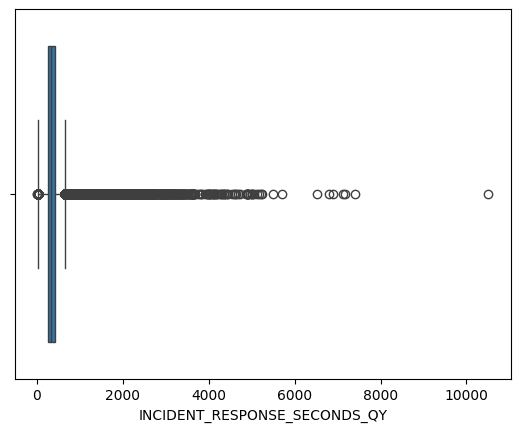

In [150]:
sns.boxplot(data=df,x='INCIDENT_RESPONSE_SECONDS_QY');

It looks like we have some serious outliers. These could be mistakes, but we aren't sure. Regardless, it looks like a small number of observations are causing a lot of skew in the distribution. Let's try this: Let's find the 99th percentile in our dataset and just remove anything above that. In otherwords, let's take out the highest 1% of response times. We'll see how that impacts our distribution. We'll use the .quantile() method in NumPy to do this

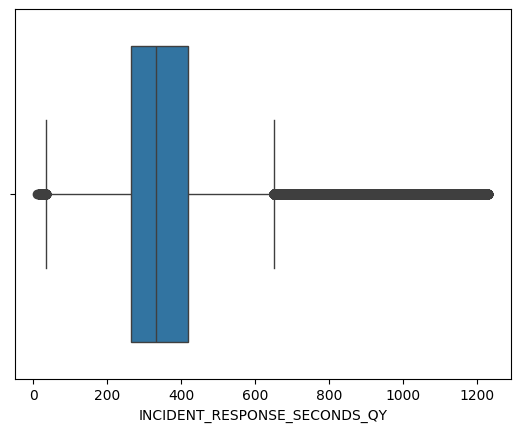

In [151]:
#we'll call the 99th percentile q99
q99=np.nanquantile(df.INCIDENT_RESPONSE_SECONDS_QY,0.99)
#now let's remove anything above q99 - ie, take out the top 1%

df=df.loc[df.INCIDENT_RESPONSE_SECONDS_QY<=q99]
#then we'll review the box plot again
sns.boxplot(data=df,x='INCIDENT_RESPONSE_SECONDS_QY');

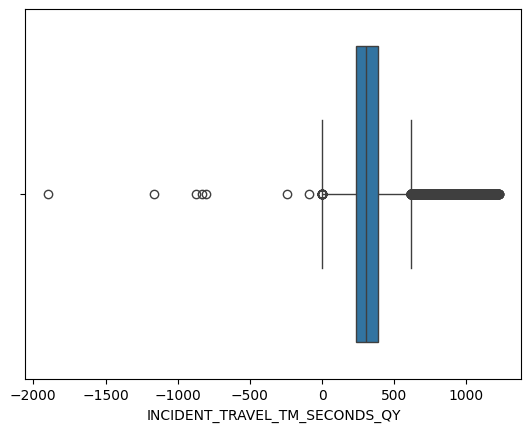

In [152]:
#lets look at the travel times while we're at it
sns.boxplot(data=df,x='INCIDENT_TRAVEL_TM_SECONDS_QY');

Negative travel times are strange. Let's see how many there are and remove them if there's only a small amount

In [153]:
negative_travel_times=len(df.loc[df.INCIDENT_TRAVEL_TM_SECONDS_QY<0])
print(f'there are {negative_travel_times} rows with negative travel times')

there are 7 rows with negative travel times


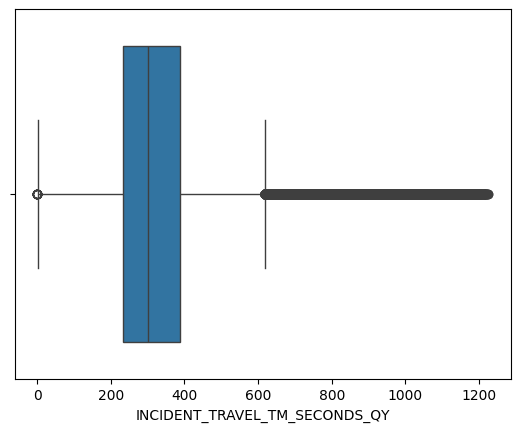

In [154]:
#remove the 9 rows with negative travel times and review the box plot again
df=df.loc[df.INCIDENT_TRAVEL_TM_SECONDS_QY>0]
sns.boxplot(data=df,x='INCIDENT_TRAVEL_TM_SECONDS_QY');

Great. Now let's look at the distribution of our time_on_scene column that we created earlier

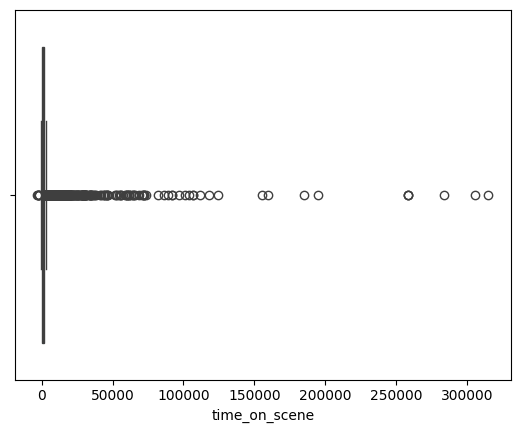

In [155]:
sns.boxplot(data=df,x='time_on_scene');

Again, this one is very outlier heavy. Let's remove the top 1%, and get rid of any erroneous negative values and inspect it again.

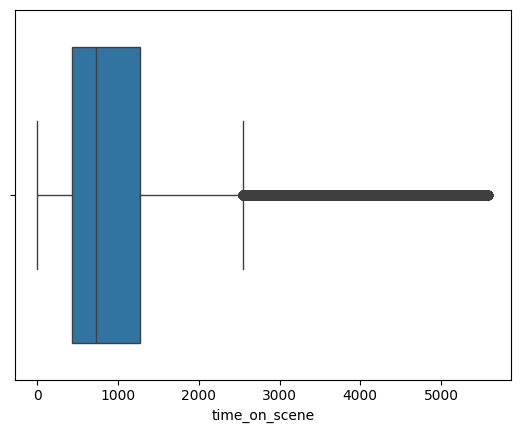

In [156]:
#we'll call the 99th percentile q99
q99=np.nanquantile(df.time_on_scene,0.99)
#now let's remove anything above q99 - ie, take out the top 1%

df=df.loc[(df.time_on_scene<=q99)&(df.time_on_scene>0)]
#then we'll review the box plot again
sns.boxplot(data=df,x='time_on_scene');

Much better. Now I also want to create a binary category for incidents in which a ladder was assigned, and a binary category for responses longer than 5 minutes. We'll use these later in the workshop.

In [157]:
#ladder assigned binary value
df['ladder_assigned']=['Ladder Assigned' if x>0 else 'No Ladder Assigned' for x in df['LADDERS_ASSIGNED_QUANTITY']]
#find responses longer than 5 minutes
df['5min_wait']=['>5 Mins' if x>5*60 else '<5 Mins' for x in df.INCIDENT_RESPONSE_SECONDS_QY]

df.head()

,STARFIRE_INCIDENT_ID,INCIDENT_DATETIME,ALARM_BOX_BOROUGH,ALARM_BOX_NUMBER,ALARM_BOX_LOCATION,INCIDENT_BOROUGH,ZIPCODE,POLICEPRECINCT,CITYCOUNCILDISTRICT,COMMUNITYDISTRICT,...,INCIDENT_RESPONSE_SECONDS_QY,INCIDENT_TRAVEL_TM_SECONDS_QY,ENGINES_ASSIGNED_QUANTITY,LADDERS_ASSIGNED_QUANTITY,OTHER_UNITS_ASSIGNED_QUANTITY,time_on_scene,date,month,ladder_assigned,5min_wait
0,240801-B0920-001-0002,2024-08-01 00:00:20,BROOKLYN,920,ALBANY AVE & PROSPECT PL,BROOKLYN,11213.0,77.0,36.0,308.0,...,208,177,3.0,2.0,1.0,2049.0,2024-08-01,August,Ladder Assigned,<5 Mins
3,240801-B1873-003-0004,2024-08-01 00:01:05,BROOKLYN,1873,LORING AVE & ELDERTS LANE,BROOKLYN,11208.0,75.0,42.0,305.0,...,153,141,1.0,1.0,0.0,546.0,2024-08-01,August,Ladder Assigned,<5 Mins
4,240801-M1071-002-0004,2024-08-01 00:02:13,MANHATTAN,1071,AMSTERDAM AVE & W 77 ST,MANHATTAN,10024.0,20.0,6.0,107.0,...,169,147,0.0,1.0,0.0,1868.0,2024-08-01,August,Ladder Assigned,<5 Mins
5,240801-M1694-001-0005,2024-08-01 00:02:35,MANHATTAN,1694,BROADWAY & W 165 ST,MANHATTAN,NaN,NaN,NaN,NaN,...,251,245,1.0,0.0,0.0,28.0,2024-08-01,August,No Ladder Assigned,<5 Mins
6,240801-R1973-001-0001,2024-08-01 00:02:41,RICHMOND / STATEN ISLAND,1973,WILLOW RD WEST & VEDDER AVE,RICHMOND / STATEN ISLAND,NaN,NaN,NaN,NaN,...,354,337,1.0,0.0,0.0,37.0,2024-08-01,August,No Ladder Assigned,>5 Mins


I also want to look at the number of engines assigned to each incident later on. For now, let's see how many missing values there are and thow them out if there's only a few

In [158]:
df.ENGINES_ASSIGNED_QUANTITY.isna()
missing_engines_assigned=len(df.loc[df.ENGINES_ASSIGNED_QUANTITY.isna()])
print(f'there are {missing_engines_assigned} rows with no data in the engines assigned column')

there are 77 rows with no data in the engines assigned column


In [159]:
#remove rows with missing values
df=df.loc[~df.ENGINES_ASSIGNED_QUANTITY.isna()]

# Bar Charts
Now let's make some plots! Let's start with the simplest of them all, the bar plot. Specifically, let's begin by visualizing the number of fire incidents by borough.

In [160]:
# bar plots - first, let's make a dataframe that is grouped by borough.
df_bar=df.groupby(['INCIDENT_BOROUGH']).INCIDENT_BOROUGH.count().reset_index(name='incident_count')
#now let's sort the dataframe from highest to lowest count
df_bar=df_bar.sort_values(by='incident_count', ascending=False)
df_bar

,INCIDENT_BOROUGH,incident_count
1,BROOKLYN,60562
2,MANHATTAN,52269
0,BRONX,48218
3,QUEENS,42022
4,RICHMOND / STATEN ISLAND,10741


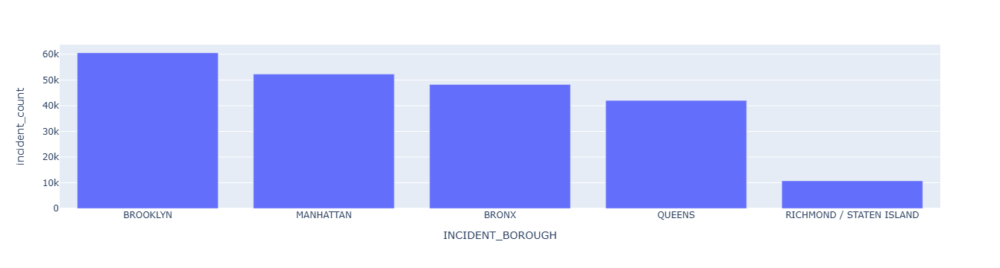

In [161]:
fig = px.bar(df_bar, x='INCIDENT_BOROUGH', y='incident_count')
fig.show()

We now have an interactive bar chart. We can hover over the bars and see the data. Let's make it more interesting by adding a third variable.

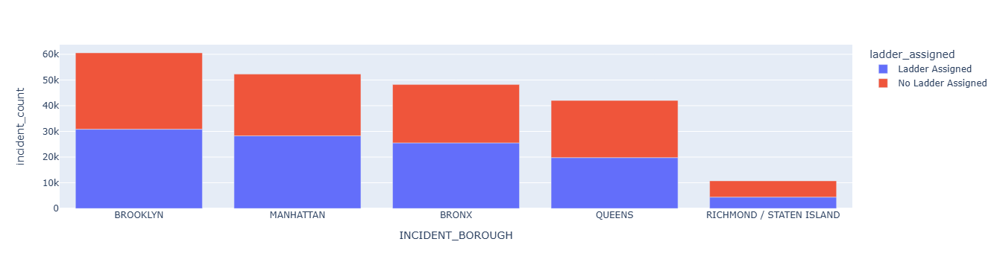

In [162]:
# let's regroup our data, but this time add the ladder_assigned variable. This way we'll see the counts of incidents by borough, broken down by which one's had a ladder assigned.
df_bar=df.groupby(['INCIDENT_BOROUGH', 'ladder_assigned']).INCIDENT_BOROUGH.count().reset_index(name='incident_count')
#now let's sort the dataframe from highest to lowest count
df_bar=df_bar.sort_values(by='incident_count', ascending=False)
df_bar

fig = px.bar(df_bar, x='INCIDENT_BOROUGH', y='incident_count', color='ladder_assigned')
fig.show()

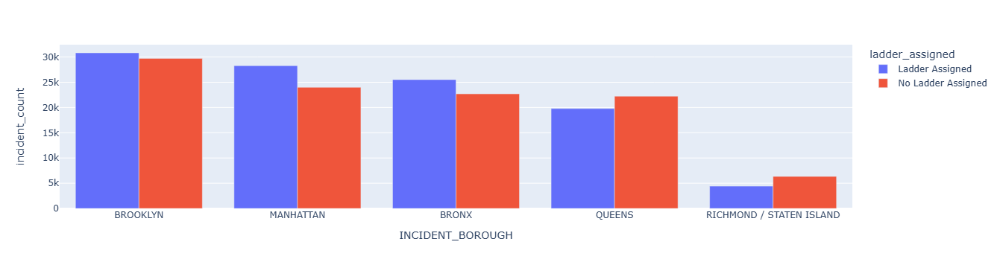

In [163]:
#we can also make a grouped version rather than stacked
fig = px.bar(df_bar, x='INCIDENT_BOROUGH', y='incident_count', color='ladder_assigned', barmode='group')
fig.show()

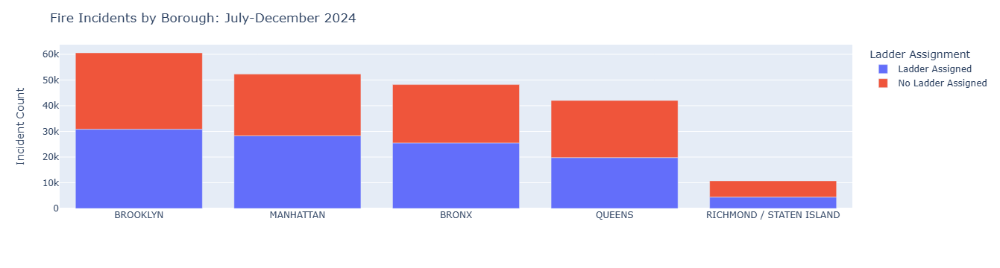

In [164]:
#lets adjust some of the labels to make this more professional
fig = px.bar(df_bar, x='INCIDENT_BOROUGH', y='incident_count', color='ladder_assigned', labels={"ladder_assigned": "Ladder Assignment"})
#use .update_laout() method to change some of the formatting options
fig.update_layout(
    xaxis_title='', #remove x-axis label because it's obvious
    yaxis_title='Incident Count',
    title='Fire Incidents by Borough: July-December 2024',
    hoverlabel=dict(
        bgcolor="white", # Set the background color
        font_size=12,
        font_family="Arial"
    )
)
fig.show()

# histograms/boxplots 
Let's visualize some distributions using plotly. We'll use our INCIDENT_RESPONSE_SECONDS_QY variable

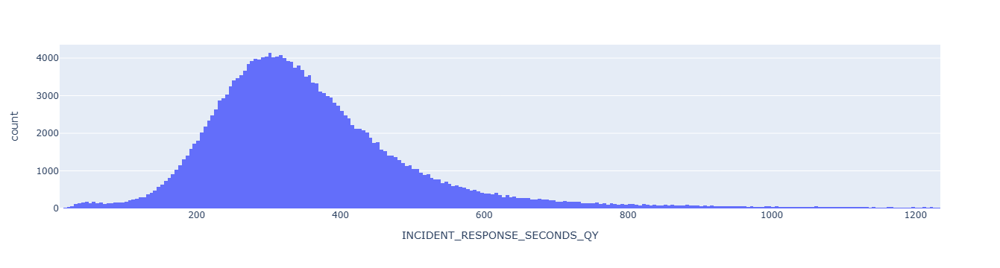

In [165]:
fig = px.histogram(df, x='INCIDENT_RESPONSE_SECONDS_QY')
fig.show()

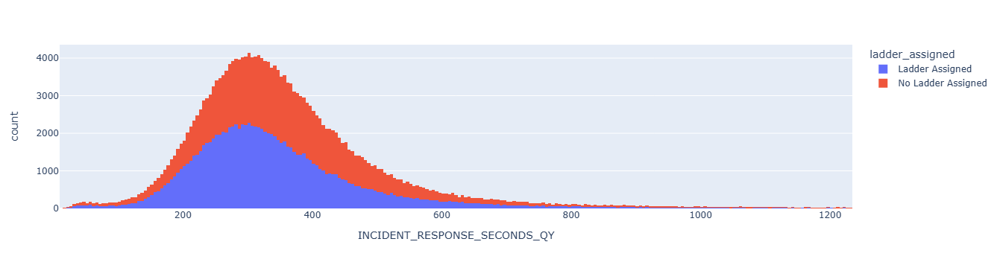

In [166]:
#we can make it more interesting by adding in a categorical variable
fig = px.histogram(df, x='INCIDENT_RESPONSE_SECONDS_QY', color='ladder_assigned')
fig.show()

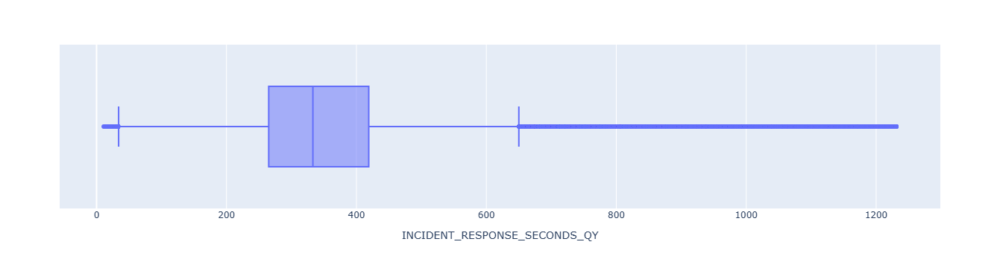

In [167]:
#lets try a box plot
fig = px.box(df, x='INCIDENT_RESPONSE_SECONDS_QY')
fig.show()

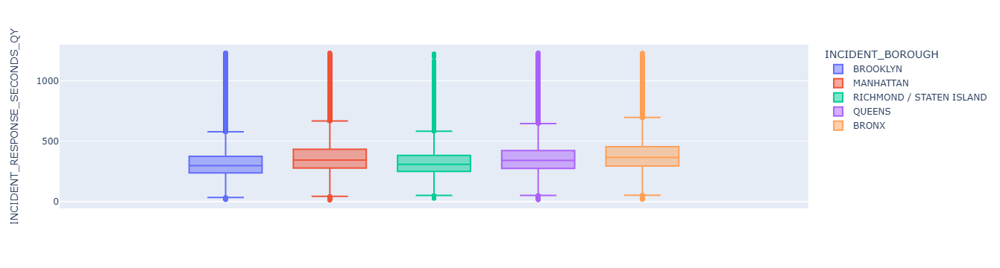

In [168]:
#lets make it vertical and look at the distribution by borough
fig = px.box(df, y='INCIDENT_RESPONSE_SECONDS_QY', color='INCIDENT_BOROUGH')
fig.show()

# scatterplots/bubbles

Let's look at some relationships between travel times and time spent on the scene of the incident using a scatterplot. Since we have a lot of data here - let's make the computation a bit faster by just visualizing a sample of the data. We'll do this using the .sample() method in Pandas. We'll pass it a fraction (number between 0-1) that represents how much of the data to sample. Let's do 1%.

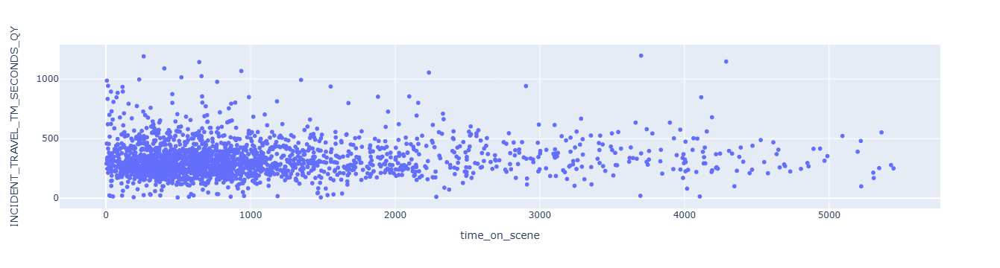

In [169]:
fig = px.scatter(df.sample(frac=0.01), x='time_on_scene', y='INCIDENT_TRAVEL_TM_SECONDS_QY')
fig.show()

There doesn't seem to be any obvious relationship between these two variables. Let's throw in a third variable to make it interesting

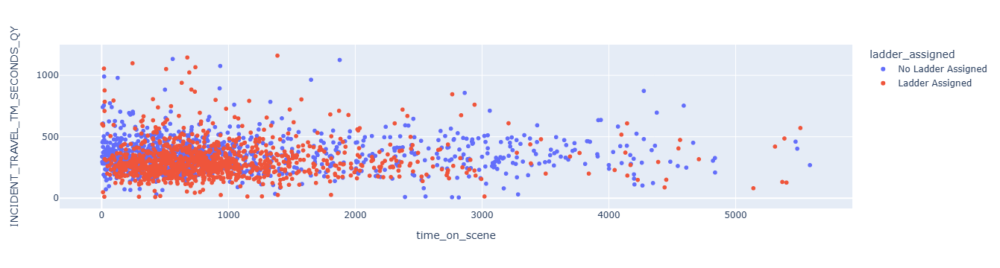

In [170]:
fig = px.scatter(df.sample(frac=0.01), x='time_on_scene', y='INCIDENT_TRAVEL_TM_SECONDS_QY', color='ladder_assigned')
fig.show()

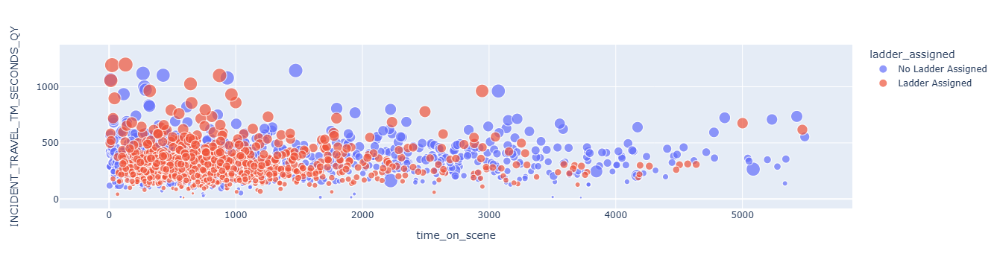

In [171]:
#lets throw in a third variable to make this a bubble chart. We'll map the incident response seconds to the size of the points on the scatterplot

fig = px.scatter(df.sample(frac=0.01), x='time_on_scene', y='INCIDENT_TRAVEL_TM_SECONDS_QY', color='ladder_assigned', size='INCIDENT_RESPONSE_SECONDS_QY')
fig.show()

# line plots

Let's visualize the number of incidents per day as a time series. Let's first group our data by the date, and count how many incidents there are on each date. We'll then use the resulting dataframe to make our line chart.

In [172]:
df_line=df.groupby(['date']).STARFIRE_INCIDENT_ID.count().reset_index(name='incident_count')
df_line

,date,incident_count
0,2024-08-01,1501
1,2024-08-02,1552
2,2024-08-03,1556
3,2024-08-04,1357
4,2024-08-05,1500
...,...,...
148,2024-12-27,1395
149,2024-12-28,1451
150,2024-12-29,1362
151,2024-12-30,1483


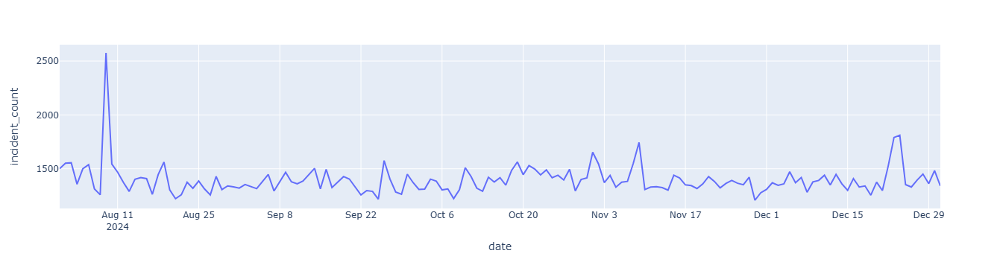

In [173]:
fig = px.line(df_line,x='date',y='incident_count')
fig.show()

In [174]:
#lets add a rolling average! We'll use the .rolling() method in pandas
df_line['10day_moving_avg']=df_line.incident_count.rolling(10).mean()
df_line

,date,incident_count,10day_moving_avg
0,2024-08-01,1501,NaN
1,2024-08-02,1552,NaN
2,2024-08-03,1556,NaN
3,2024-08-04,1357,NaN
4,2024-08-05,1500,NaN
...,...,...,...
148,2024-12-27,1395,1447.6
149,2024-12-28,1451,1458.6
150,2024-12-29,1362,1469.3
151,2024-12-30,1483,1480.0


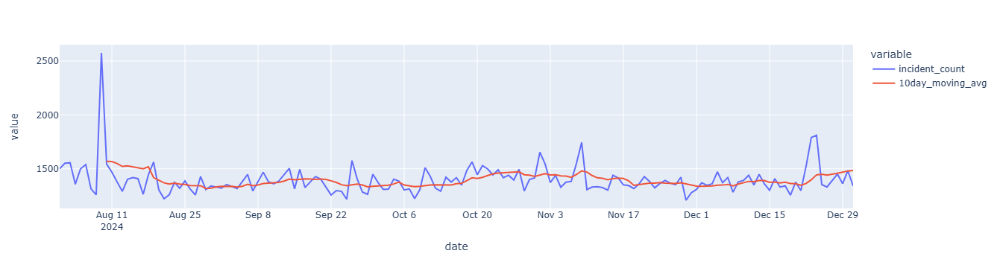

In [175]:
fig = px.line(df_line,x='date',y=['incident_count', '10day_moving_avg'])
fig.show()

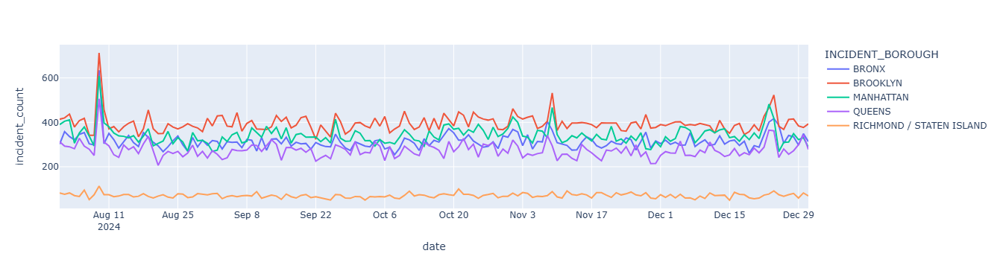

In [176]:
#lets break it down by borough
df_line2=df.groupby(['date', 'INCIDENT_BOROUGH']).STARFIRE_INCIDENT_ID.count().reset_index(name='incident_count')
fig = px.line(df_line2,x='date',y='incident_count', color='INCIDENT_BOROUGH')
fig.show()

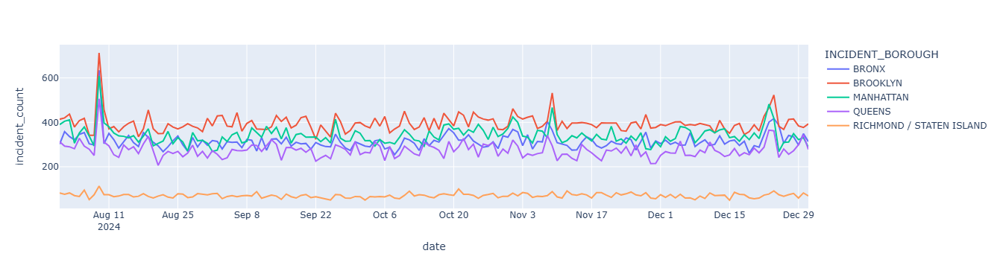

In [177]:
#it's a lot of work to hover over all 5 lines. We can "unify" the hover across all points on the x-axis by changing the "hovermode" to "x unified". Give it a shot
fig = px.line(df_line2,x='date',y='incident_count', color='INCIDENT_BOROUGH')
fig.update_layout(hovermode="x unified")
fig.show()

# animation

Plotly gives us the ability to do some basic animations in our visuals. To do this, we can provide a variable that the animation will "scroll" through. Time is typically a good variable to animate across. We'll show how the relationship between time on the scene and incident travel time changed by month (we'll use the month variable we created earlier)

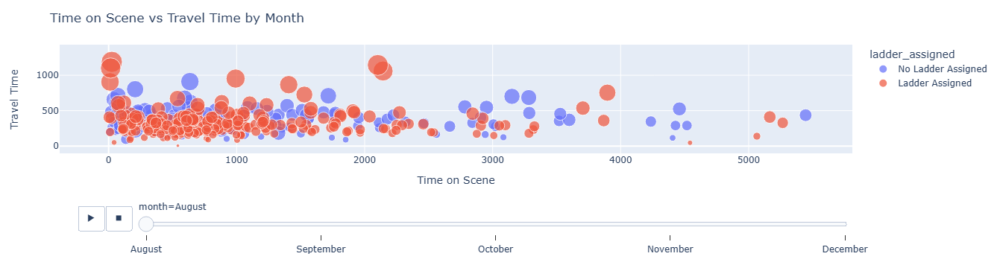

In [178]:
month_order=['August', 'September', 'October', 'November', 'December']
fig = px.scatter(df.sample(frac=0.01), x='time_on_scene', y='INCIDENT_TRAVEL_TM_SECONDS_QY', color='ladder_assigned', size='INCIDENT_RESPONSE_SECONDS_QY',
                animation_frame='month', 
                 category_orders={'month': month_order}) # This controls the order)
fig.update_layout(
    xaxis_title='Time on Scene', #remove x-axis label because it's obvious
    yaxis_title='Travel Time',
    title='Time on Scene vs Travel Time by Month',
    hoverlabel=dict(
        bgcolor="white", # Set the background color
        font_size=12,
        font_family="Arial"
    )
)
fig.show()

# sankey diagrams

Sankey diagrams are a more advanced visual technique we can implement in Plotly. As you can see, creating Sankey diagrams requires quite a bit more data wrangling than any of the visualizations we've discussed so far. The key features of a sankey diagram are as follows:

labels - these are the names of each of the different categories on your diagram

sources - these are the labels from which the "flow" begins

targets - these are the labels to which the "flow" is received from the source. 

values - these represent "how much" flows from source label to target label

Lets get started

In [179]:
#prepare the data for the diagram
set1=df['INCIDENT_BOROUGH'].unique().tolist()
set2=df['ladder_assigned'].unique().tolist()
set3=df['5min_wait'].unique().tolist()
set_dict={'INCIDENT_BOROUGH':set1,
         'ladder_assigned':set2,
         '5min_wait': set3}
labels =set1+set2+set3

source=[]
target=[]
value=[]
sets=[k for k in set_dict]
for i, l in enumerate(sets):
    #stop before last set - no more connections from there
    if l!=sets[-1]:
        sources=df[l].unique()
        for s in sources:
            #source.append(labels.index(s))
            targets=df.loc[df[l]==s][sets[i+1]].unique().tolist()
            for t in targets:
                source.append(labels.index(s))
                target.append(labels.index(t))
                val=len(df.loc[(df[l]==s)&(df[sets[i+1]]==t)])
                value.append(val)

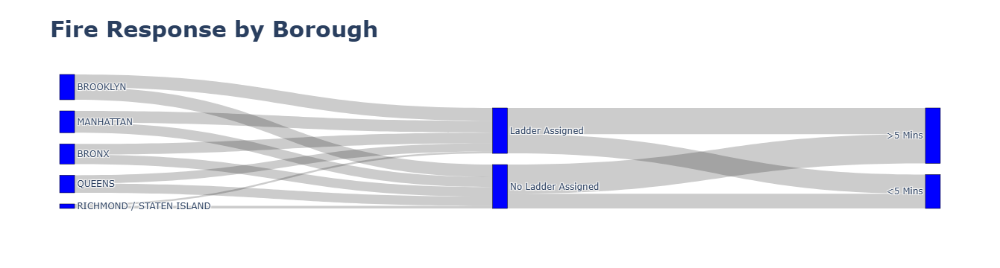

In [180]:
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue",
      hovertemplate='%{label}: %{value}<extra></extra>'
    ),
    link = dict(
      source = source, 
      target = target,
      value = value,
      hovertemplate='%{source.label} and %{target.label}: %{value}<extra></extra>'
  ))])

fig.update_layout(title="<span style='font-size:30px;'><b>Fire Response by Borough</b></span>")
#fig.update_layout(title_text='Fire Response by Borough', title_font=36)
fig.show()

See more at: https://plotly.com/python/sankey-diagram/

# Export your plotly visual to an html file

In [181]:
fig.write_html("sankey_example.html")